In [1]:
import glob

import pandas as pd
import numpy as np
import scanpy as sc
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pathlib
import celltypist
from celltypist import models
params = {
    'font.size': 12,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'legend.fontsize': 12,
    'xtick.labelsize': 8,
    'ytick.labelsize': 10,
    'font.family': "Arial",
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'figure.dpi': 100
   }

mpl.rcParams.update(params)

sns.set_style("ticks")
sns.set_context(context='paper')
savefig_args = {"dpi": 300, "bbox_inches": "tight", "pad_inches": 0, "transparent": True}
mpl.rc('savefig', dpi=300)
output_dir='../../figures/QCandAnnotation'
pathlib.Path(output_dir).mkdir(parents=True, exist_ok=True)
output_suffix = ""
output_formats = [".png", ".svg"]
sc.settings.figdir = output_dir
sc.set_figure_params(format='pdf', transparent=True,)
def save_figure(fig, name, output_dir=output_dir, output_suffix=output_suffix, output_formats=output_formats, savefig_args=savefig_args):
    for output_format in output_formats:
        fig.savefig(output_dir + "/" + name + output_suffix + output_format, **savefig_args)
    return None

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 20) 
pd.set_option('display.width', 100)
%load_ext autoreload
%autoreload 2


def recluster(adata, batch_correct, sample_uid = 'sample_uid'):
    sc.pp.pca(adata)
    if batch_correct == True:
        sc.external.pp.bbknn(adata, batch_key=sample_uid)
    else:
        sc.pp.neighbors(adata, n_neighbors=10)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color = sample_uid)
    return adata

In [2]:
def cluster(adata, batch_correct=False, batch_key="tissue"
):
    print("PCA-ing")
    sc.pp.pca(adata)
    print("drawing neighbor graph")
    if batch_correct == True:
        print("batch corrected neighbors")
        sce.pp.bbknn(adata, batch_key=batch_key)
    else:
        sc.pp.neighbors(adata, n_neighbors=20)
    print("UMAP-ing")
    sc.tl.umap(adata)
    print("leiden-ing")
    sc.tl.leiden(adata, resolution=0.3, key_added="global_leiden")
                 
    return adata

In [3]:
def plot_umaps(adata, colors, folder, subset):
    for color in colors:
        sc.pl.umap(adata, color=color, frameon=True,
          title="{}".format(color), add_outline=True, legend_fontoutline=4, legend_fontsize='x-small', save="{}_{}_{}".format(tissue, subset, color))
    return adata

In [4]:
umap_vars = ['sample_uid', 'donor', 'predicted_labels', 'global_leiden']

/home/michaelswift/repos/shared_data/pipeline_outs/gex_object_LN.h5ad.gz
/home/michaelswift/repos/shared_data/pipeline_outs/gex_object_PB.h5ad.gz
/home/michaelswift/repos/shared_data/pipeline_outs/gex_object_BM.h5ad.gz
PCA-ing
drawing neighbor graph
UMAP-ing
leiden-ing


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 34 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'M', 'P', 'T', 'U', 'a', 'b', 'd', 'e', 'f', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'underscore', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 36, 37, 48, 51, 55, 56, 66, 68, 69, 71, 72, 73, 75, 76, 79, 80, 81, 82, 83, 85, 86, 88, 93]
Closed glyph list over 'GSUB': 39 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'M', 'P', 'T', 'U', 'a', 'b', 'd', 'e', 'f', 'fi', 'five', 'fl', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 'three', 'two', 'u', 'underscore', 'uniFB00', 'uniFB03', 'uniFB04', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 36, 37, 48, 

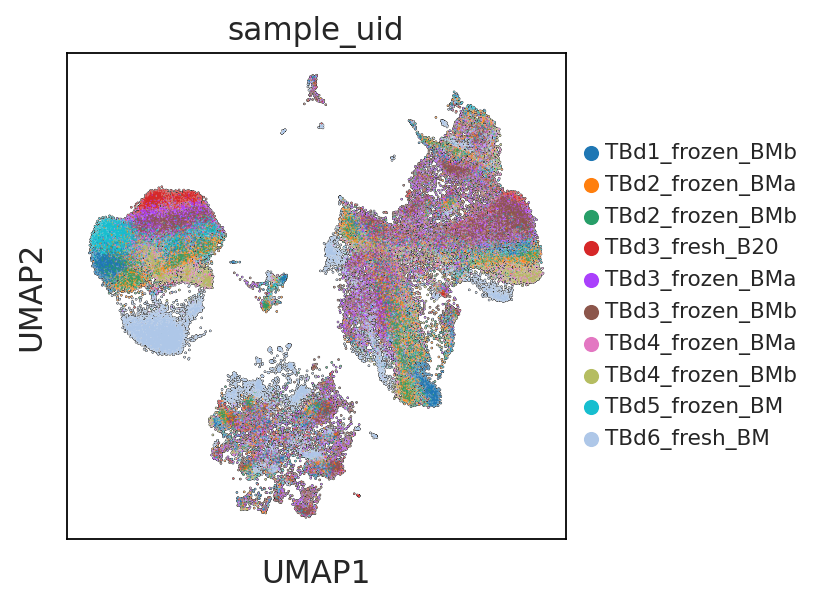

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 20 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'M', 'P', 'T', 'U', 'd', 'five', 'four', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 'six', 'space', 'three', 'two']
Glyph IDs:   [0, 1, 2, 3, 20, 21, 22, 23, 24, 25, 36, 37, 48, 51, 55, 56, 71, 81, 82, 85]
Closed glyph list over 'GSUB': 20 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'M', 'P', 'T', 'U', 'd', 'five', 'four', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 'six', 'space', 'three', 'two']
Glyph IDs:   [0, 1, 2, 3, 20, 21, 22, 23, 24, 25, 36, 37, 48, 51, 55, 56, 71, 81, 82, 85]
Closing glyph list over 'MATH': 20 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'M', 'P', 'T', 'U', 'd', 'five', 'four', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 'six', 'space', 'three', 'two']
Glyph IDs:   [0, 1, 2, 3, 20, 21,

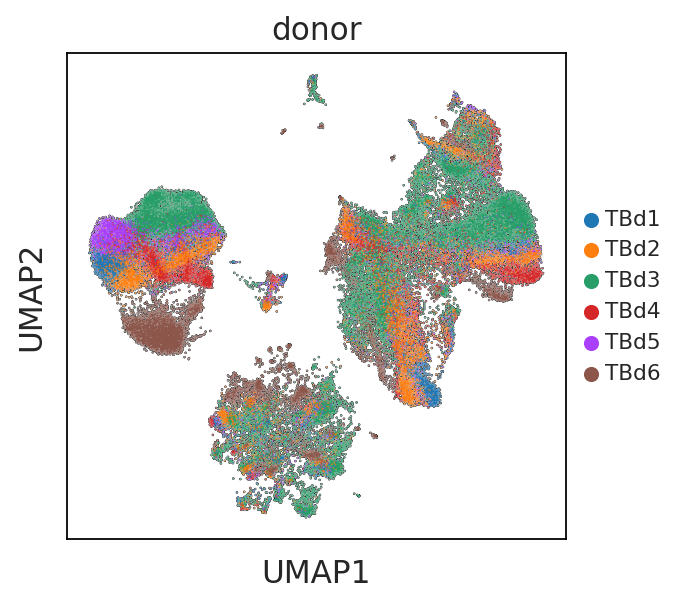

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 57 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'plus', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'x', 'y']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 16, 18, 20, 21, 22, 23, 25, 26, 27, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 51, 53, 54, 55, 56, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 91, 92]
Closed glyph list over 'GSUB': 62 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 

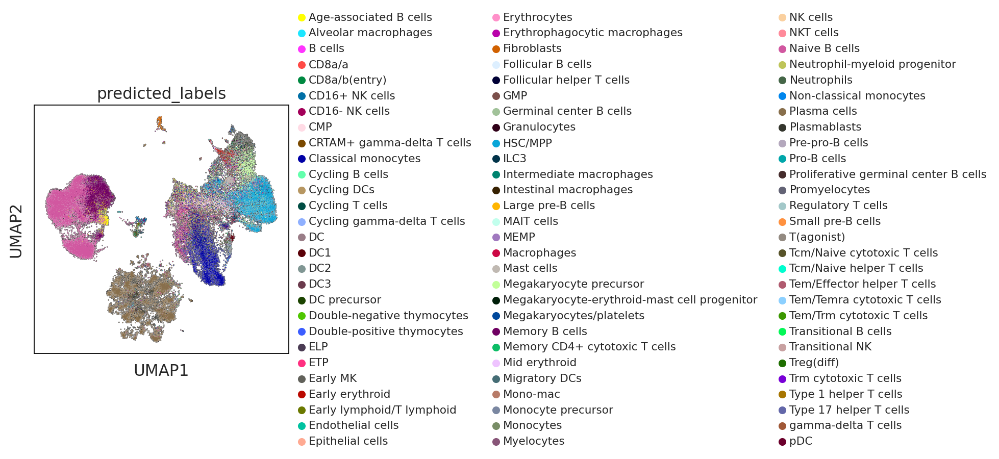

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
name pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 28 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'U', 'a', 'b', 'd', 'e', 'eight', 'five', 'four', 'g', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 48, 51, 56, 66, 68, 69, 71, 72, 74, 76, 79, 81, 82]
Closed glyph list over 'GSUB': 28 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'M', 'P', 'U', 'a', 'b', 'd', 'e', 'eight', 'five', 'four', 'g', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'seven', 'six', 'space', 'three', 'two', 'underscore', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 48, 51, 56, 66, 68, 69, 71, 72, 74, 76, 79, 81, 82]
Closing glyph list over 'MATH': 28 glyphs before
Gl

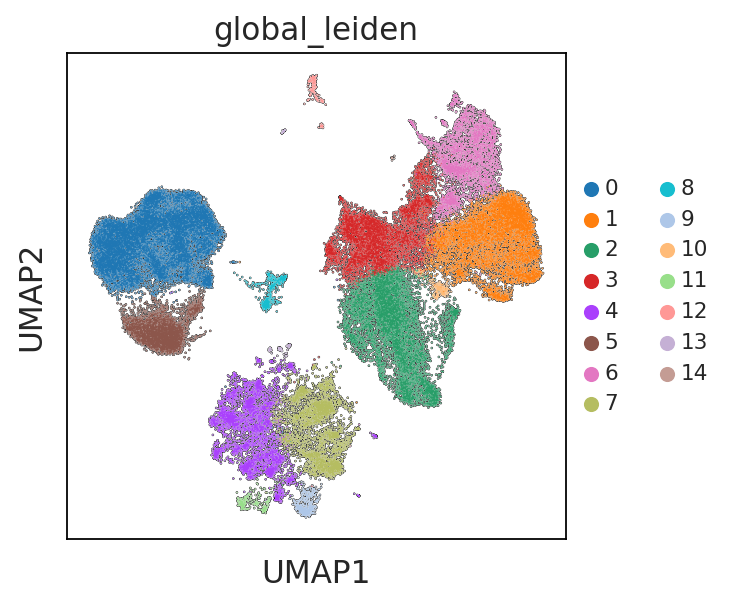

🔬 Input data has 68935 cells and 36601 genes
🔗 Matching reference genes in the model
🧬 6147 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🗳️ Majority voting the predictions
✅ Majority voting done!


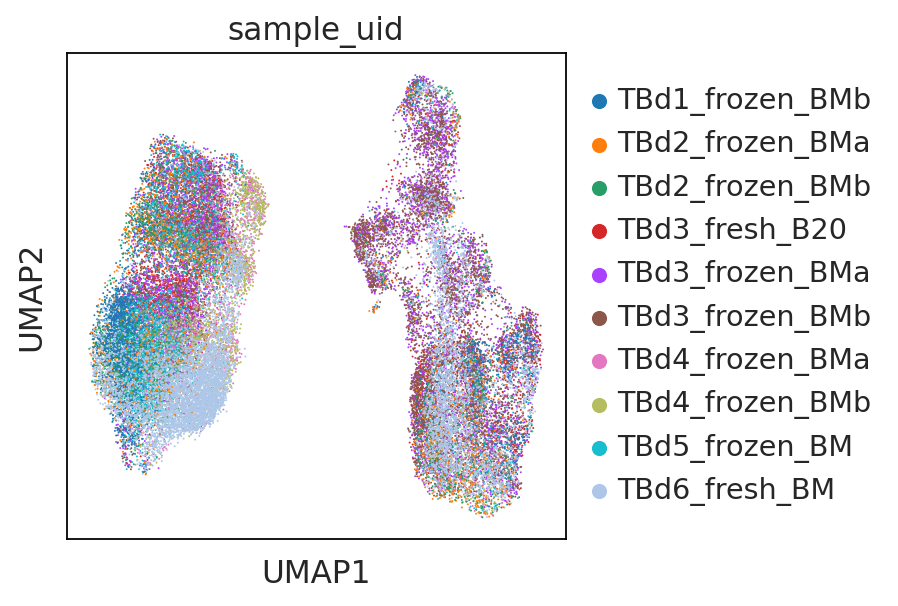

🔬 Input data has 39108 cells and 36601 genes
🔗 Matching reference genes in the model
🧬 6147 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


/home/michaelswift/repos/shared_data/pipeline_outs/gex_object.h5ad.gz
/home/michaelswift/repos/shared_data/pipeline_outs/gex_object_subsampled.h5ad.gz
/home/michaelswift/repos/shared_data/pipeline_outs/web_summary
/home/michaelswift/repos/shared_data/pipeline_outs/gex_object_SP.h5ad.gz


In [5]:
data_path = "/home/michaelswift/repos/shared_data/pipeline_outs/"
tissue = "BM"

for file in glob.glob(data_path+"*"):
    print(file)
    # do the routine:
    # load data
    if tissue in file:
        adata = sc.read_h5ad(file)
        # remove IGH and IGL variable genes from highly variable genes for clustering analysis 
        adata.var.loc[adata.var.index.str.contains("IGHV|IGLV|IGKV"), 'highly_variable'] = False
        # ad hoc exclusion of weird samples
        adata = adata[adata.obs.sample_uid != 'TBd3_fresh_B200']
        adata = cluster(adata, batch_correct=False)
        filter_low_abundance_cell_groups = False
        cell_group = "predicted_labels"
        if filter_low_abundance_cell_groups:
            select = adata.obs[cell_group].value_counts() > (adata.obs.shape[0] / 1000)
            adata = adata[adata.obs[cell_group].isin(select[select == True].index)]
        adata = plot_umaps(adata, colors = umap_vars, folder = tissue, subset = tissue)
        predictions = celltypist.annotate(adata, model = 'Immune_All_Low.pkl', majority_voting=True, over_clustering='global_leiden')
        adata = predictions.to_adata()
        # not sure why this isn't added automatically
        adata.uns['log1p'] = {"base":np.e}
        bcells = adata[adata.obs[cell_group].str.contains('B cells|Plasma')]
        bcells.obs.sample_uid.value_counts()
        # Make all IG not a highly variable gene for clustering purposes
        bcells.var.loc[bcells.var.index.str.contains("IGH|IGL|IGK"), 'highly_variable'] = False
        bcells = recluster(bcells, batch_correct=True)
        # Celltypist Annotations to bcells object
        predictions = celltypist.annotate(bcells, model = 'Immune_All_Low.pkl', majority_voting=True, mode = 'prob match')
        bcells = predictions.to_adata()
        leiden_key = "b_lineage_leiden"
        sc.tl.leiden(bcells, resolution=1, key_added=leiden_key)

bcells = plot_umaps(bcells, colors = umap_vars + [leiden_key], folder = tissue, subset = "bcells" )

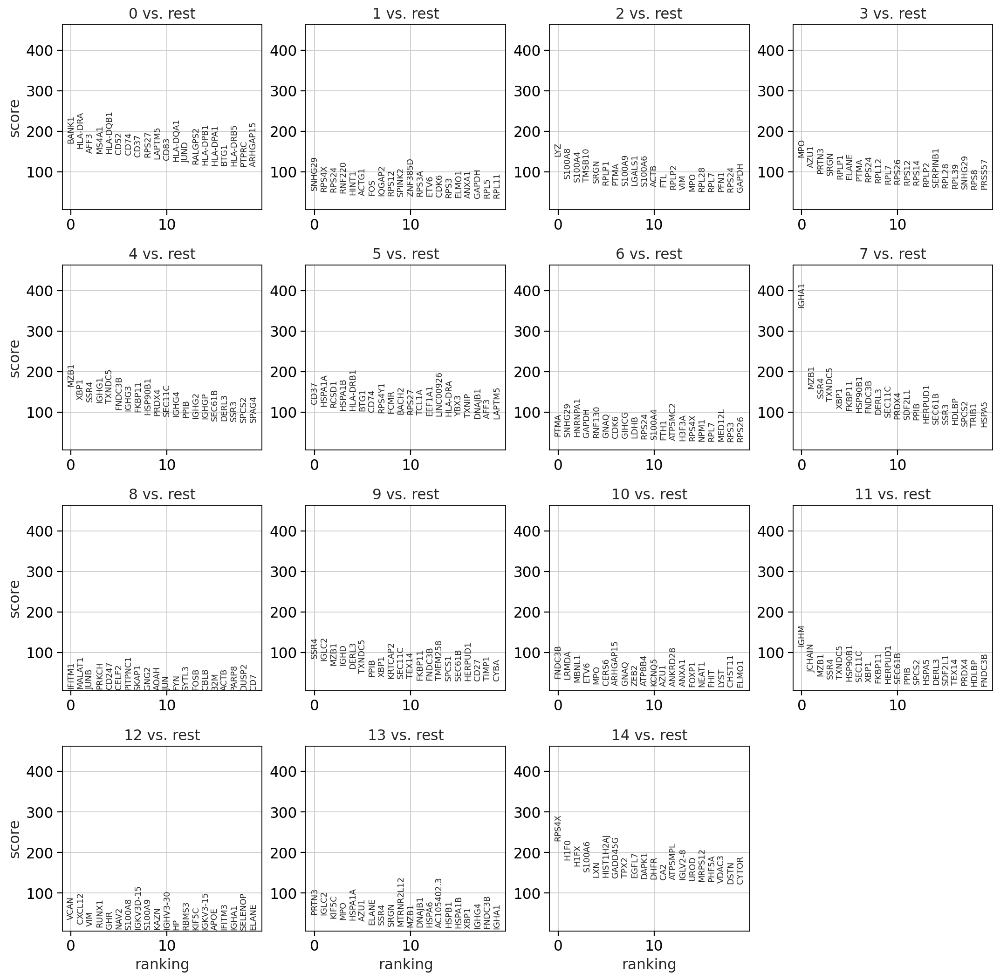

In [6]:
sc.tl.rank_genes_groups(bcells, groupby='global_leiden')

sc.pl.rank_genes_groups(bcells)

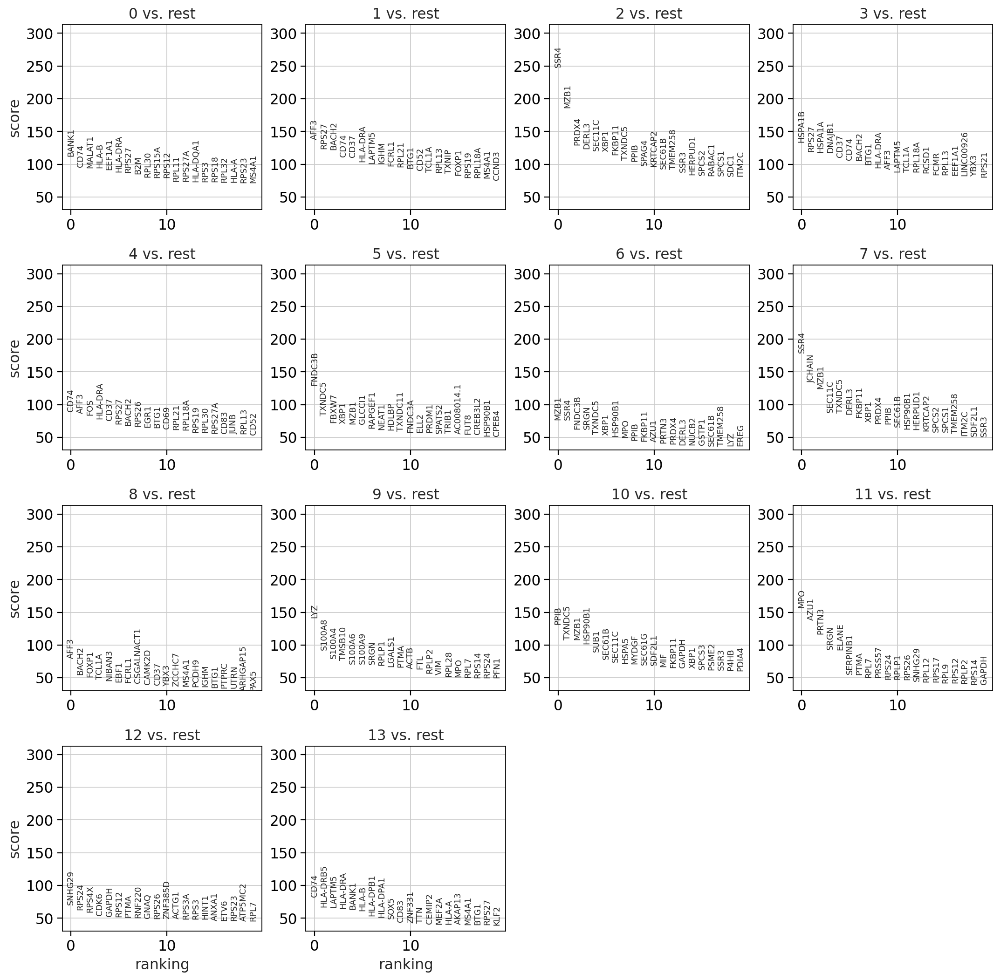

In [7]:
sc.tl.rank_genes_groups(bcells, groupby='b_lineage_leiden')

sc.pl.rank_genes_groups(bcells)

In [8]:
# add possible predicted labels
bcells.obs['possible_predicted_labels'] = bcells.obs.predicted_labels.str.count("\|") + 1

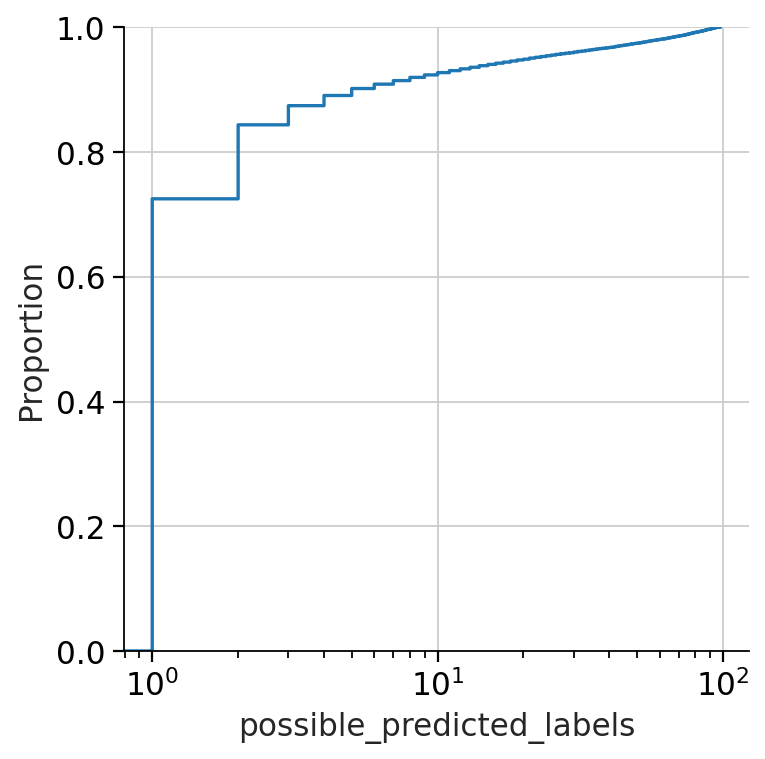

In [9]:
sns.displot(bcells.obs.possible_predicted_labels, kind= 'ecdf', log_scale=True)

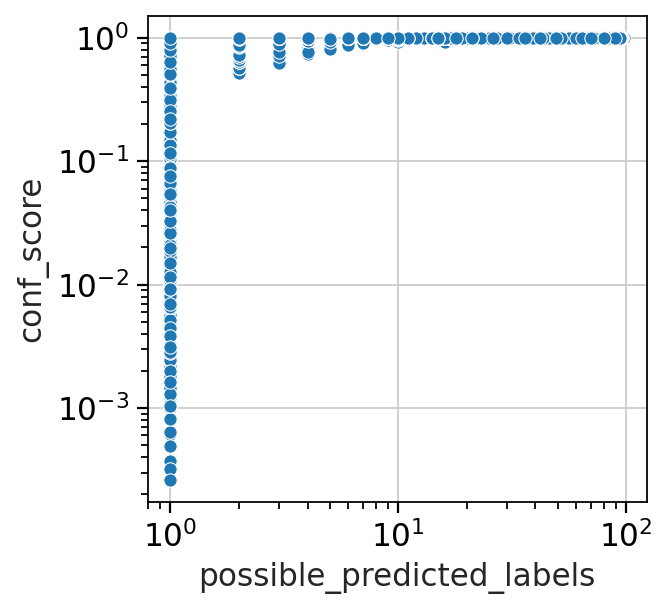

In [10]:
sns.scatterplot(data = bcells.obs, x = 'possible_predicted_labels', y = 'conf_score')
plt.xscale('log')
plt.yscale('log')

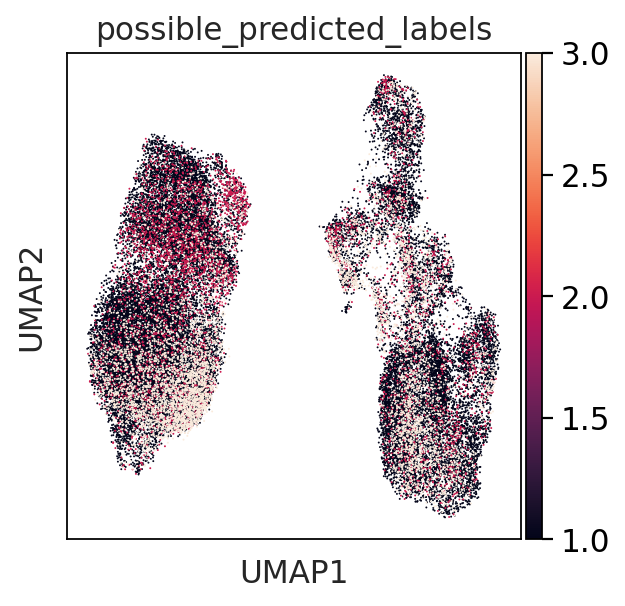

In [11]:
sc.pl.umap(bcells, color = 'possible_predicted_labels', vmax = 3)

In [12]:
bcells.obs["predicted_label"] = bcells.obs.predicted_labels.str.split('|', expand=True)[0]

... storing 'predicted_label' as categorical


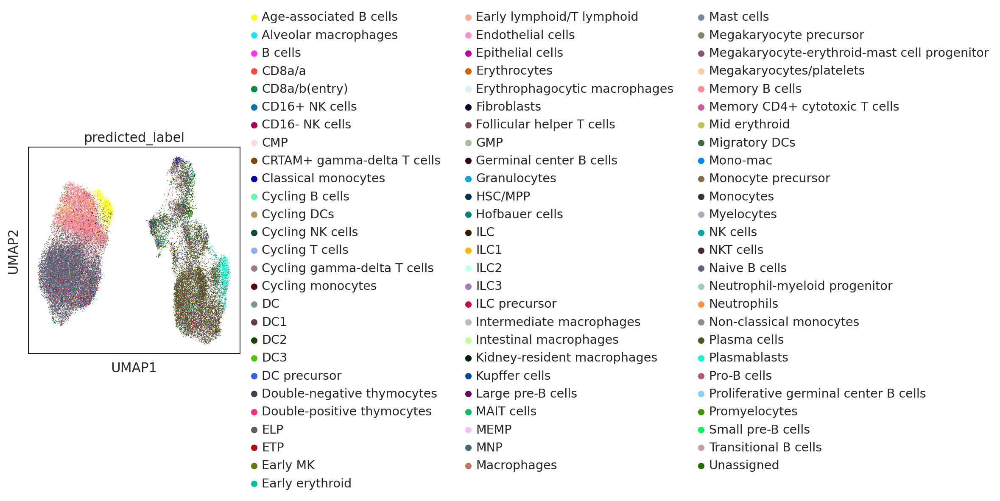

In [13]:
sc.pl.umap(bcells, color = 'predicted_label')

In [14]:
bcells_filtered = bcells[bcells.obs.possible_predicted_labels < 3]

In [15]:
bcells_filtered.uns['predicted_labels_colors'] = []

In [16]:
bcells_filtered.uns['predicted_label_colors'] = []

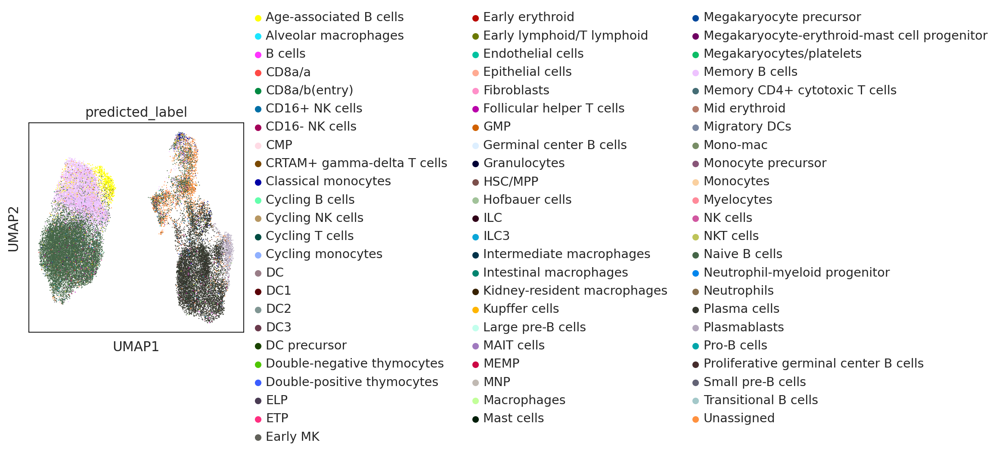

In [17]:
sc.pl.umap( bcells_filtered, color = 'predicted_label')

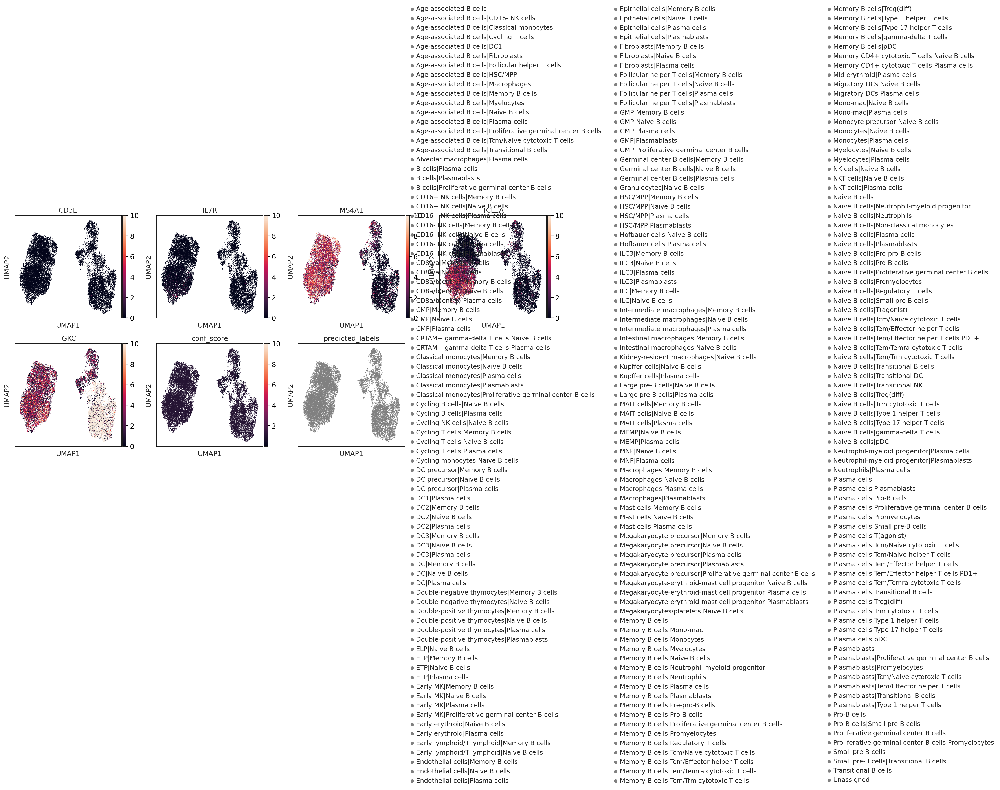

In [18]:
sc.pl.umap(bcells_filtered, color=['CD3E', 'IL7R', 'MS4A1', 'TCL1A', 'IGKC', 'conf_score', 'predicted_labels'], layer='umi_counts', vmax = 10)

In [19]:
sc.pp.calculate_qc_metrics(bcells_filtered, inplace=True)

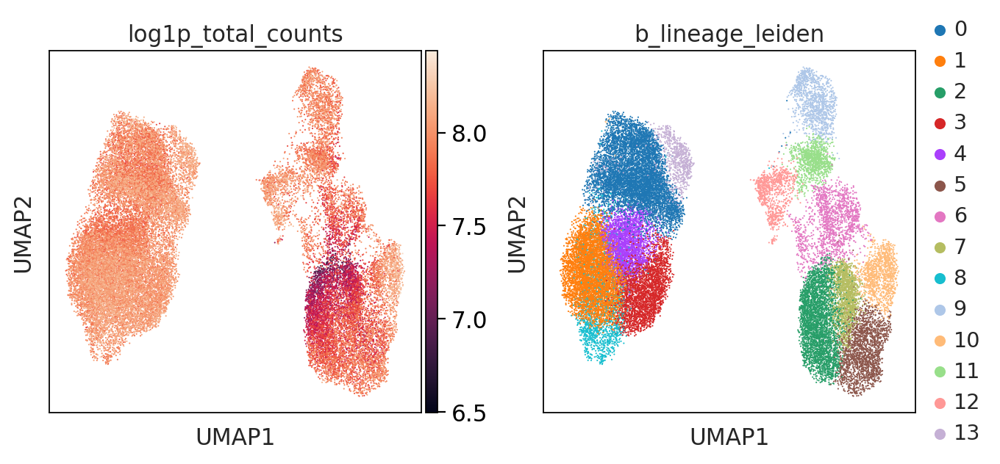

In [20]:
sc.pl.umap(bcells_filtered, color = ['log1p_total_counts', 'b_lineage_leiden'])

In [21]:
sc.tl.rank_genes_groups(bcells_filtered, groupby='b_lineage_leiden')

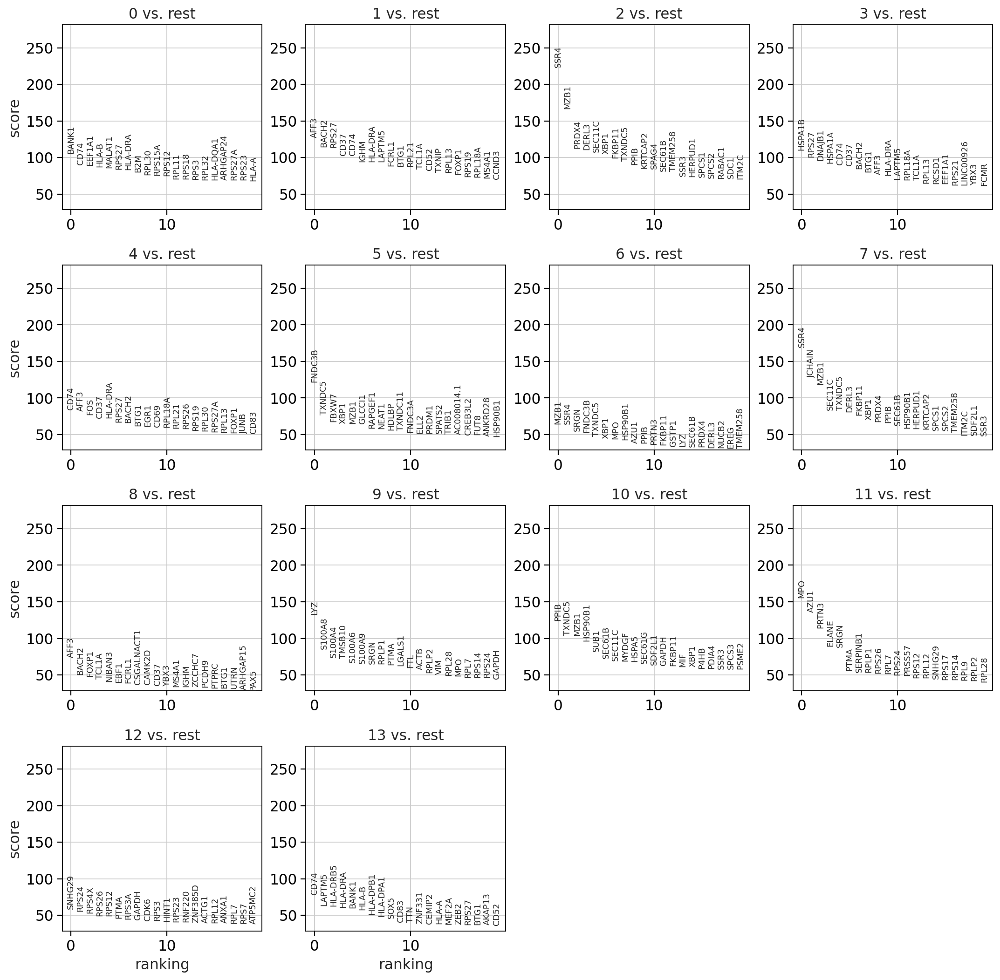

In [22]:
sc.pl.rank_genes_groups(bcells_filtered)

# Maybe identifying legitimately different kinds of plasma cells

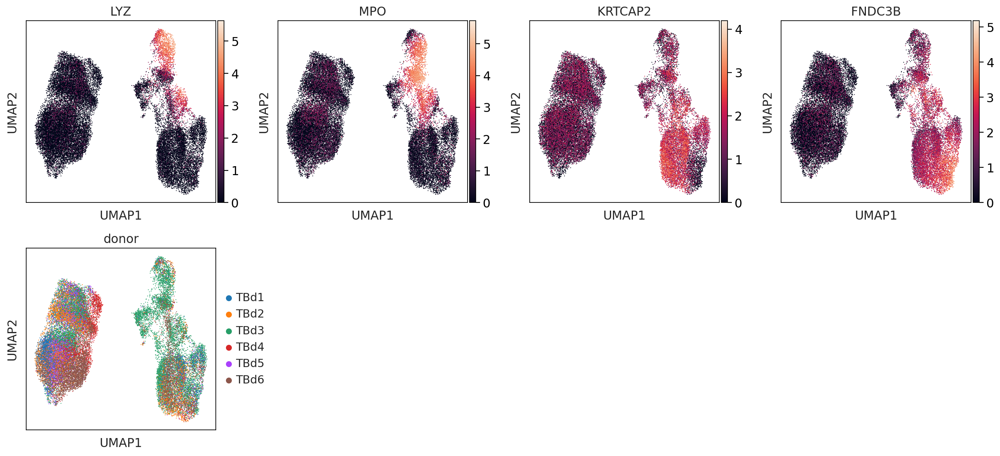

In [23]:
sc.pl.umap(bcells_filtered, color = ['LYZ', 'MPO', "KRTCAP2", "FNDC3B", 'donor'])

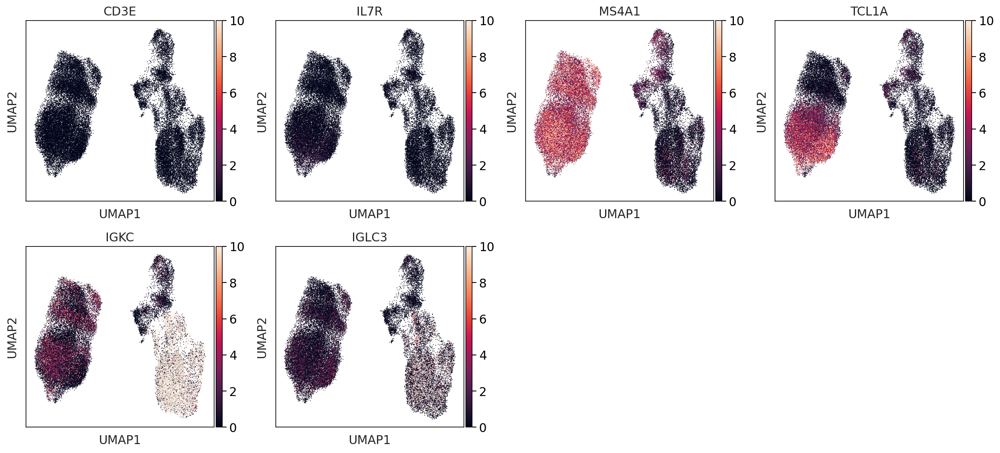

In [24]:
sc.pl.umap(bcells, color=['CD3E', 'IL7R', 'MS4A1', 'TCL1A', 'IGKC', "IGLC3"], layer='background_removed', vmax = 10)

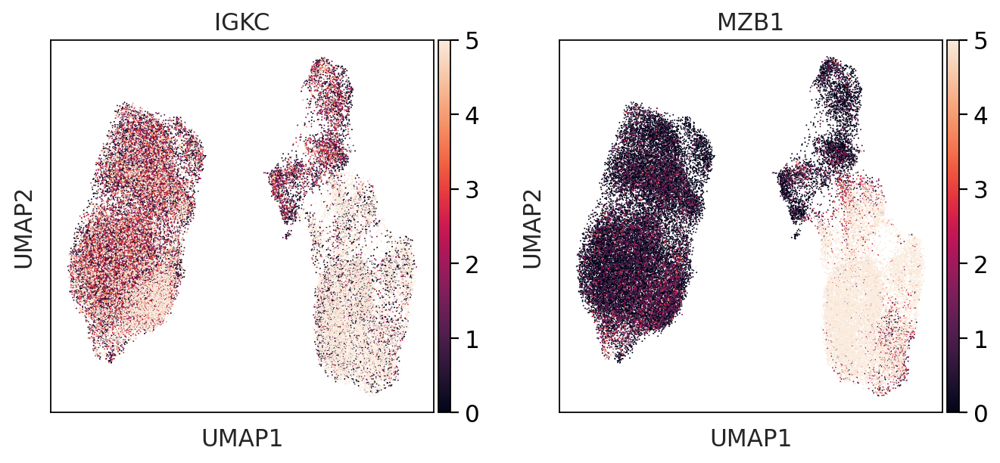

In [25]:
sc.pl.umap(bcells, color = ['IGKC', 'MZB1'], layer = 'umi_counts', vmax = 5)

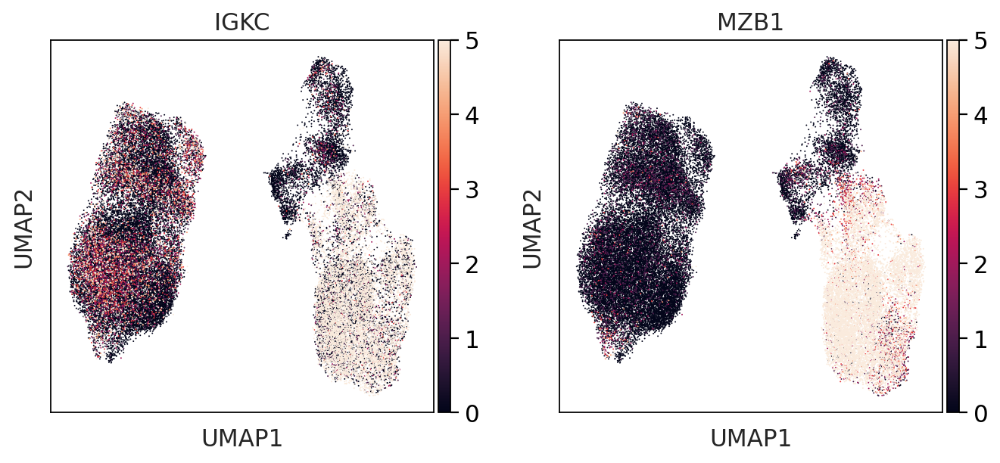

In [26]:
sc.pl.umap(bcells, color = ['IGKC', 'MZB1'], layer = 'background_removed', vmax = 5)

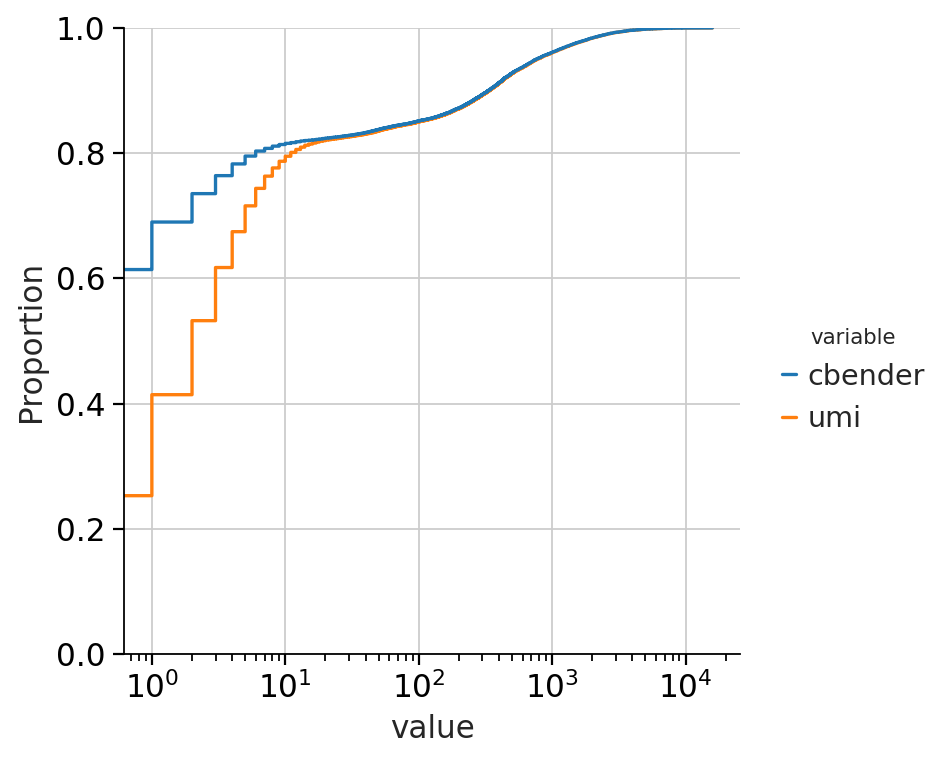

In [27]:
gene = "IGKC"

_umi = sc.get.obs_df(bcells, keys = gene, layer='umi_counts')
_bg = sc.get.obs_df(bcells, keys = gene, layer='background_removed')

data = pd.concat([_bg, _umi], axis=1)

data.columns = ['cbender', 'umi']

data = data.melt()

sns.displot(data, x = 'value', hue = 'variable', kind = 'ecdf', log_scale=True)

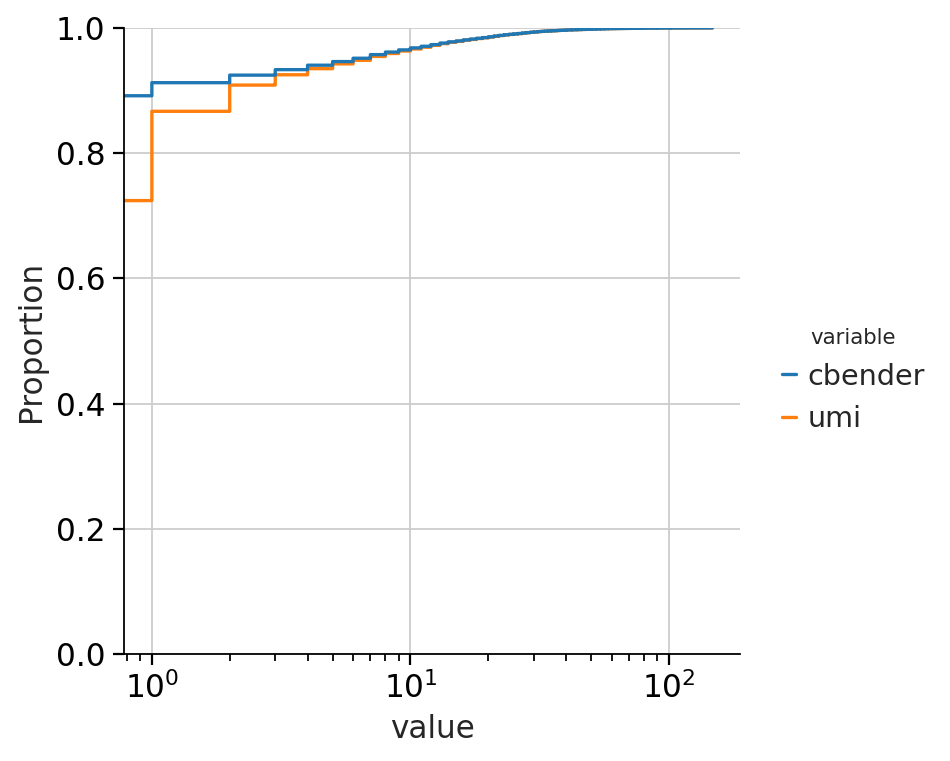

In [28]:
gene = "AZU1"

_umi = sc.get.obs_df(bcells, keys = gene, layer='umi_counts')
_bg = sc.get.obs_df(bcells, keys = gene, layer='background_removed')

data = pd.concat([_bg, _umi], axis=1)

data.columns = ['cbender', 'umi']

data = data.melt()

sns.displot(data, x = 'value', hue = 'variable', kind = 'ecdf', log_scale=True)

## Filter Leiden groups which appear to be other celltypes

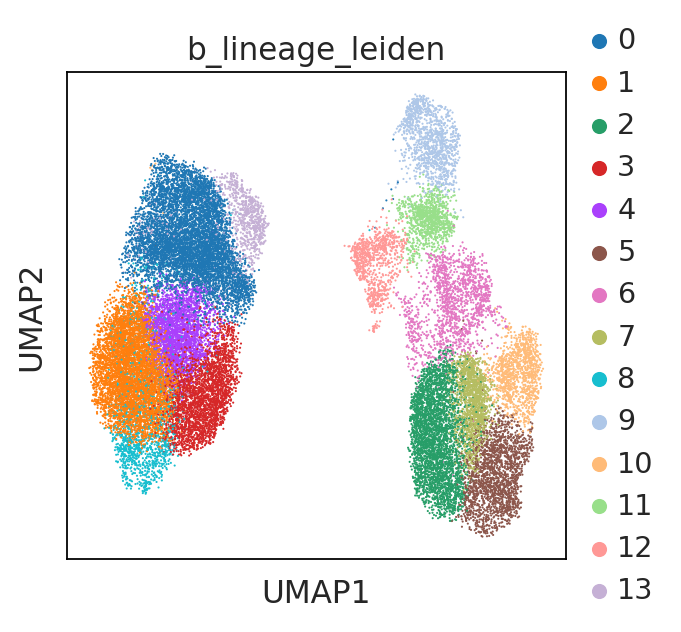

In [29]:
sc.pl.umap(bcells_filtered, color = 'b_lineage_leiden')

In [30]:
filter_cells = True

In [31]:
if filter_cells:
    # ad hoc filtering, i think basically these clusters are not plasma or B Cells 
    bcells = bcells[~bcells.obs.b_lineage_leiden.isin(['9', '6','11','12'])]
    
    bcells.write_h5ad("{}_Bcells_Filtered.h5ad".format(tissue))